In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
from utils import segpath2path, pairwise_distances, point2segments
from analysis_by_plot import *

In [2]:
var_name = 'noise_sensor' 
# var_name = 'noise_motor'   
goal_idx = -1   
# goal_idx = -28 # near obstacle    

condcode = int(var_name == 'noise_sensor') * 2 + int(goal_idx == -1)
if condcode in (2, 3):
    record_dir = 'sensor_noisefreetrain_robustness_3in1_fixedroute'
elif condcode in (0, 1):
    record_dir = 'motor_robustness_3in1_fixtrainroute'
print(condcode, var_name, goal_idx, record_dir)

3 noise_sensor -1 sensor_noisefreetrain_robustness_3in1_fixedroute


In [3]:
# record_dir = 'motor_robustness_3in1_randinitorn' #### the data source is wrong; this looks just random motor
ls_value = 0, 0.1, 0.2, 0.5, 1, 2, 5, 10, 20, 50

n_condition = len(ls_value)
catchment_radius = 0.372 / 2 ## 0.372 is the wheel axle length of Freight

n_trial = 100
n_epoch_train, n_epoch_test = 125, 500
# ls_model_keys = 'pure-pursuit', 'lamb', 'visual-localisor'
ls_model_name = 'pure-pursuit', 'visual-localisor', 'differential-MB', 'klinokinesis-MB'
ls_color = 'tab:blue', 'tab:orange', 'tab:green', 'tab:red'
n_model = len(ls_model_name)

In [4]:
# data_path = np.load(os.path.join('records', record_dir, 'data_path.npy'), allow_pickle=True)[()]
data_path = np.load(os.path.join('records', record_dir, 'data_path_with_kk.npy'), allow_pickle=True)[()]

model_name = 'klinokinesis-MB'
data_path[model_name] = {'train': [], 'test': []}
ls_coeff = 2, 0.1, 0.2, 0.5, 1, 2, 5, 10, 20, 50
for val in ls_coeff:        
    data_dir = os.path.join('records', 'gridsearch-routefollow/klino-obstacleavoidance', 'rot_coeff{}'.format(val))
    for trial_idx, trial_dir in enumerate(sorted(os.listdir(data_dir))[:n_trial]):
        path = {'test': None, 'train': None}
        ### load path data          
        for phase in ('train', 'test'):
            data_file = os.path.join(data_dir, trial_dir, 'Freight_{}_0_record.npz'.format(phase))
            try:
                path = np.array([np.load(data_file)[arg] for arg in 'xy'])
                if phase == 'test' and path.shape[1] < n_epoch_test:
                    path = np.pad(path, ((0, 0), (0, 500 - path.shape[1])), constant_values=np.nan)
            except:
                print("The file {} does not exist.".format(data_file))
            data_path[model_name][phase].append(path)
            
for phase, n_epoch in zip(('train', 'test'), (n_epoch_train, n_epoch_test)):
    data_path[model_name][phase] = np.reshape(data_path[model_name][phase], (len(ls_coeff), n_trial, 2, n_epoch))

np.save(os.path.join('records', record_dir, 'data_path_with_kk.npy'), data_path)

In [5]:
data_dist_test2goal, data_min_dist2goal, data_time_min_dist2goal = {}, {}, {}
data_dist_testtrunc2goal = {}
data_time_catchment = {}

for model_name in ls_model_name:
    data_path[model_name]['test'] = (data_path[model_name]['test'].T - data_path[model_name]['test'][:, :, :, 0].T).T
    path_train_init = data_path[model_name]['train'][:, :, :, 0]
    data_path[model_name]['train'] = (data_path[model_name]['train'].T - path_train_init.T).T
    path_train_goal = data_path[model_name]['train'][:, :, :, goal_idx]
    dist_init2goal = np.linalg.norm(path_train_goal, axis=-1)
    dist_test2goal = np.linalg.norm(path_train_goal[:, :, :, np.newaxis] - data_path[model_name]['test'], axis=2)
    time_min_dist2goal = np.nanargmin(dist_test2goal, axis=2)
    min_dist2goal = np.nanmin(dist_test2goal, axis=2)
    
    data_dist_test2goal[model_name] = dist_test2goal
    data_min_dist2goal[model_name] = min_dist2goal
    data_time_min_dist2goal[model_name] = time_min_dist2goal
    
    nan_mask = (time_min_dist2goal.T < np.tile(np.arange(n_epoch_test), (n_condition, n_trial, 1)).T).T
    nan_mask_path = np.moveaxis(np.tile(nan_mask, (2, 1, 1, 1)), 0, 2)
    data_dist_testtrunc2goal[model_name] = np.where(nan_mask, np.nan, dist_test2goal)
    data_path[model_name]['test_trunc'] = np.where(nan_mask_path, np.nan, data_path[model_name]['test'])

    time_catchment = np.argmax(dist_test2goal <= catchment_radius, axis=-1)
    data_time_catchment[model_name] = np.where(time_catchment == 0, np.nan, time_catchment)

record_dir_2in1 = 'sensor_noisefreetrain_robustness_3in1_fixedroute', 'odometry_noisefreetrain_robustness_2in1_fixedroute', 'vision_noisefreetrain_robustness_2in1_fixedroute'
var_name = 'noise'
ls_value = 0, 0.1, 0.2, 0.5, 1, 2, 5, 10, 20, 50
n_condition = len(ls_value)
catchment_radius = 0.372 / 2


n_trial = 100
n_epoch_train, n_epoch_test = 125, 500
goal_idx = -1
# ls_model_keys_2in1 = ('pure-pursuit', 'lamb', 'visual-localisor'), ('pure-pursuit', 'visual-localisor'), ('lamb', 'visual-localisor')
ls_model_name_2in1 = ('pure-pursuit', 'differential-MB', 'visual-localisor'), ('pure-pursuit', 'visual-localisor'), ('differential-MB', 'visual-localisor')
ls_model_newname_2in1 = ('pure-pursuit', 'differential-MB', 'visual-localisor'), ('pure-pursuit-l', 'visual-localisor-l'), ('differential-MB-v', 'visual-localisor-v')

data_path = {}
data_dist_test2goal, data_min_dist2goal, data_time_min_dist2goal = {}, {}, {}
data_dist_testtrunc2goal = {}
data_time_catchment = {}

for record_dir, ls_model_name, ls_model_newname in zip(record_dir_2in1, ls_model_name_2in1, ls_model_newname_2in1):
    rawdata_path = np.load(os.path.join('records', record_dir, 'data_path.npy'), allow_pickle=True)[()]

    for model_name, model_newname in zip(ls_model_name, ls_model_newname):
        data_path[model_newname] = rawdata_path.pop(model_name)
        
    for model_name in ls_model_newname:
        data_path[model_name]['test'] = (data_path[model_name]['test'].T - data_path[model_name]['test'][:, :, :, 0].T).T
        path_train_init = data_path[model_name]['train'][:, :, :, 0]
        data_path[model_name]['train'] = (data_path[model_name]['train'].T - path_train_init.T).T
        path_train_goal = data_path[model_name]['train'][:, :, :, -1]
        dist_init2goal = np.linalg.norm(path_train_goal, axis=-1)
        dist_test2goal = np.linalg.norm(path_train_goal[:, :, :, np.newaxis] - data_path[model_name]['test'], axis=2)
        time_min_dist2goal = np.argmin(dist_test2goal, axis=2)
        min_dist2goal = np.min(dist_test2goal, axis=2)

        data_dist_test2goal[model_name] = dist_test2goal
        data_min_dist2goal[model_name] = min_dist2goal
        data_time_min_dist2goal[model_name] = time_min_dist2goal

        nan_mask = (time_min_dist2goal.T < np.tile(np.arange(n_epoch_test), (n_condition, n_trial, 1)).T).T
        nan_mask_path = np.moveaxis(np.tile(nan_mask, (2, 1, 1, 1)), 0, 2)
        data_dist_testtrunc2goal[model_name] = np.where(nan_mask, np.nan, dist_test2goal)
        data_path[model_name]['test_trunc'] = np.where(nan_mask_path, np.nan, data_path[model_name]['test'])

        time_catchment = np.argmax(dist_test2goal <= catchment_radius, axis=-1)
        data_time_catchment[model_name] = np.where(time_catchment == 0, np.nan, time_catchment)
        
ls_model_name = 'pure-pursuit', 'differential-MB', 'visual-localisor', 'visual-localisor-v', 'visual-localisor-l'
ls_color = 'tab:blue', 'tab:green', 'tab:orange', 'tab:purple', 'tab:brown'
n_model = len(ls_model_name)
ls_model_name = np.array(ls_model_name)[[0,4,2,3,1]]
ls_color = np.array(ls_color)[[0,4,2,3,1]]

In [6]:
data_dsim_test2train, data_dist_test2path = {}, {}

for model_name in ls_model_name:
    model_dsim_test2train, model_dist_test2path = [], []
    for path_train_val, path_test_val, time_mindist_test2goal_val in zip(data_path[model_name]['train'], 
                                                                          data_path[model_name]['test_trunc'],
                                                                          data_time_min_dist2goal[model_name]):
        val_time_mindist = []
        val_dist_test2path = np.full((n_trial, n_epoch_test), np.nan)
        for trial_idx, (path_train_trial, path_test_trial, time_mindist) in enumerate(zip(path_train_val, 
                                                                                        path_test_val, 
                                                                                        time_mindist_test2goal_val)):
            dsim_test2train, dist_test2path = segpath2path(path_test_trial.T[:time_mindist + 1], path_train_trial.T)
            val_time_mindist.append(dsim_test2train)
            val_dist_test2path[trial_idx, :time_mindist + 1] = dist_test2path
        model_dsim_test2train.append(val_time_mindist)
        model_dist_test2path.append(val_dist_test2path)
        
    data_dsim_test2train[model_name] = np.array(model_dsim_test2train)
    data_dist_test2path[model_name] = np.array(model_dist_test2path)

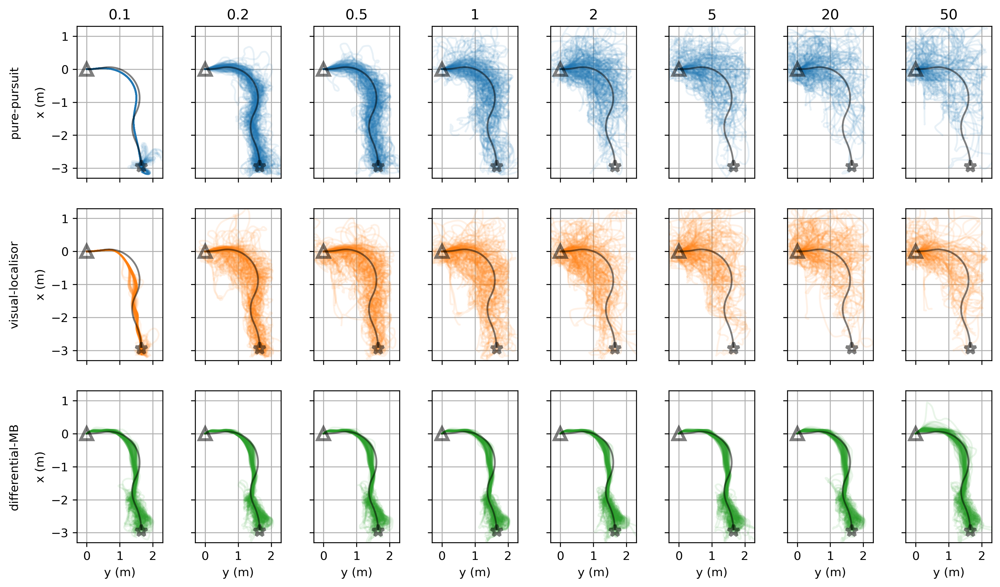

In [7]:
fig, axes = plt.subplots(3, 8, sharex=True, sharey=True, figsize=(14, 8), dpi=300)
lw = 5
alpha = 0.5

for model_name, axrow, color in zip(ls_model_name, axes, ls_color):
    for dtp_train, dtp_testtrunc, val, ax in zip(data_path[model_name]['train'], 
                                                            data_path[model_name]['test_trunc'],
                                                            [0.1, 0.2, 0.5, 1, 2, 5, 20, 50], axrow):
        for trial_idx, (path_train, path_test_trunc) in enumerate(zip(dtp_train, dtp_testtrunc)):
            if trial_idx % 1 == 0:
                ax.plot(*path_test_trunc, c=color, alpha=0.1)#, ls='dotted')
        
        ax.plot(*path_train[:, :goal_idx], c='k', alpha=0.5)
        ax.plot(*path_train[:, 0], marker='^', c='k', mfc='none', markersize=10, markeredgewidth=lw/2, alpha=alpha)
        ax.plot(*path_train[:, goal_idx], marker='*', c='k', mfc='none', markersize=10, markeredgewidth=lw/2, alpha=alpha)


    
for ax in axes.flatten():
    ax.set_aspect('equal')
    ax.grid()
    ax.set_xlim(-0.3, 2.3)
    ax.set_ylim(-3.3, 1.3)
    ax.set_xticks([0, 1, 2])
    
for ax, val in zip(axes[0], [0.1, 0.2, 0.5, 1, 2, 5, 20, 50]):
    ax.set_title(val)

for ax in axes[-1]:
    ax.set_xlabel('y (m)')
    
for ax, model_name in zip(axes.T[0], ls_model_name):
    ax.set_ylabel('{}\n\nx (m)'.format(model_name))
    

<ipython-input-8-adc660b54357>:46: RuntimeWarning: Mean of empty slice
  ax.plot(progress_step, np.nanmean(val_test2path, axis=0), color=color, ls='dashed')
/home/yihelu/miniconda3/envs/python3.8/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1218: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
/home/yihelu/miniconda3/envs/python3.8/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
<ipython-input-8-adc660b54357>:46: RuntimeWarning: Mean of empty slice
  ax.plot(progress_step, np.nanmean(val_test2path, axis=0), color=color, ls='dashed')
/home/yihelu/miniconda3/envs/python3.8/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1218: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
/home/yihelu/miniconda3/envs/python3.8/lib/python3.8/site-p

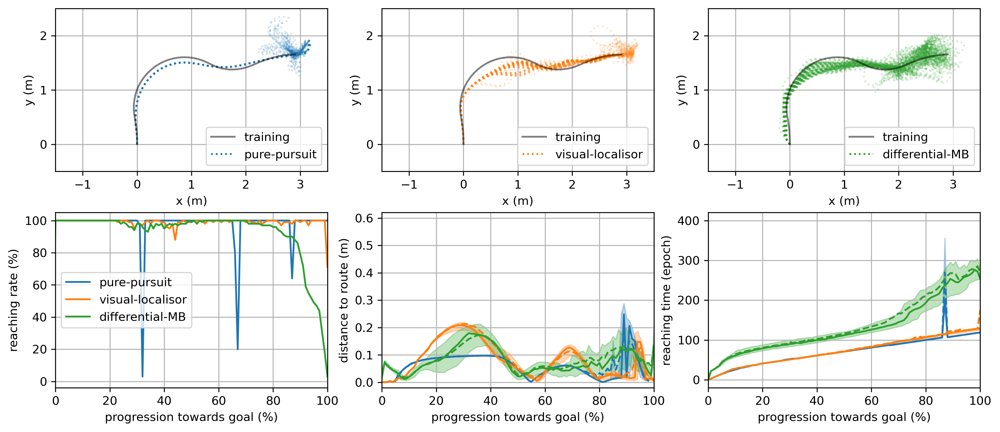

In [8]:
fig, axes = plt.subplots(2, 3, figsize=(14, 6), sharex='row', dpi=300)

ls_validx = 0, 0, 0


for model_name, ax, color, validx in zip(ls_model_name, axes[0], ls_color, ls_validx):
    dtp_train, dtp_test, dtp_test_trunc = [data_path[model_name][phase][validx] for phase in ('train', 'test', 'test_trunc')]
    for trial_idx, (path_train, path_test, path_test_trunc) in enumerate(zip(dtp_train, dtp_test, dtp_test_trunc)):
        if trial_idx % 1 == 0:
            ax.plot(-path_test_trunc[1], path_test_trunc[0], c=color, alpha=0.2, ls='dotted')

    ax.plot(-path_train[:, :goal_idx][1], path_train[:, :goal_idx][0], c='k', alpha=0.5, label='training')
    ax.plot([], [], c=color, ls='dotted', label=model_name)

    ax.set_xlabel('x (m)')
    ax.set_ylabel('y (m)')
    ax.set_xticks(np.arange(-1, 3.1, 1))
    ax.set_yticks(np.arange(0, 2.1, 1))
    ax.set_xlim(-1.5, 3.5)
    ax.set_ylim(-0.5, 2.5)
    ax.set_aspect('equal')    
    ax.legend(loc=4)
    ax.grid()


bx, ax, cx = axes[1]
for model_name, color, validx in zip(ls_model_name, ls_color, ls_validx):
    dist_test2goal, dist_test2path = data_dist_test2goal[model_name][validx], data_dist_test2path[model_name][validx]
    progress = np.rint((1 - np.divide(dist_test2goal.T, dist_test2goal[:, 0]).T) * 100)
    progress_step = np.arange(np.nanmin(progress), np.nanmax(progress) + 1)

    val_test2path, val_n_point = [], []
    val_ptime = []
    for trial_progress, trial_test2path in zip(progress, dist_test2path):
        px, pxidx, pxinv = np.unique(trial_progress, return_index=True, return_inverse=True)
        pxinvsort = np.argsort(pxinv)
        t2p_interp = np.interp(progress_step, pxinv[pxinvsort], trial_test2path[pxinvsort], left=np.nan, right=np.nan)
        val_test2path.append(t2p_interp)
        val_n_point.extend(px)

        ptime = np.full_like(progress_step, np.nan)
        ptime[(px[~np.isnan(px)] - np.min(progress_step)).astype(int)] = pxidx[~np.isnan(px)]
        val_ptime.append(ptime)


    ax.plot(progress_step, np.nanmean(val_test2path, axis=0), color=color, ls='dashed')
    ax.plot(progress_step, np.nanmedian(val_test2path, axis=0), color=color)

    ax.fill_between(progress_step, *np.nanquantile(val_test2path, (0.25, 0.75), axis=0), color=color, alpha=0.3)

    p_reach, n_reach = np.unique(val_n_point, return_counts=True)
    bx.plot(p_reach, n_reach, color=color, label=model_name)

    cx.plot(progress_step, np.nanmean(val_ptime, axis=0), color=color, ls='dashed')
    cx.plot(progress_step, np.nanmedian(val_ptime, axis=0), color=color)
    cx.fill_between(progress_step, *np.nanquantile(val_ptime, (0.25, 0.75), axis=0), color=color, alpha=0.3)
        
for ax, yl in zip(axes[1], ('reaching rate (%)', 'distance to route (m)', 'reaching time (epoch)')):
    ax.set_xlim(0, 100)
    ax.grid()
    ax.set_ylabel(yl)
    ax.set_xlabel('progression towards goal (%)')


axes[1, 0].legend()
    
axes[1, 2].set_ylim(-20, 420)
axes[1, 2].set_yticks(np.arange(0, 401, 100))
axes[1, 1].set_ylim(-0.02, 0.62)
axes[1, 1].set_yticks(np.arange(0, 0.61, 0.1))

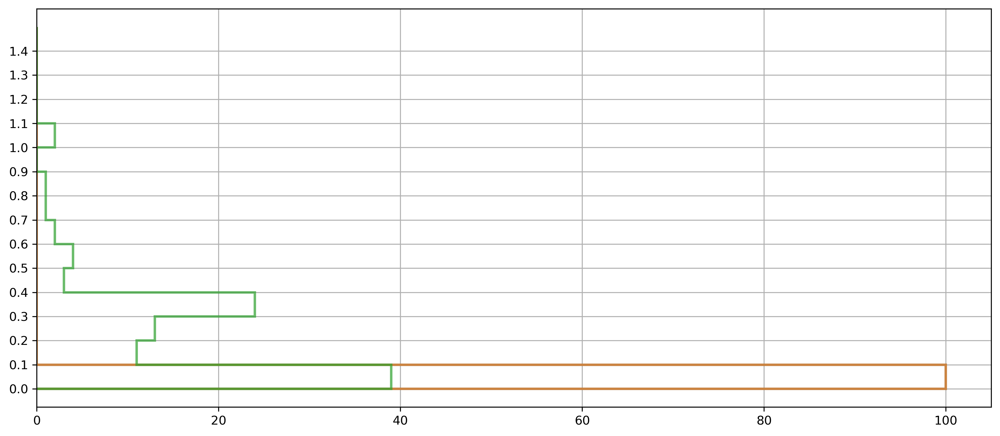

In [9]:
fig, ax = plt.subplots(figsize=(14, 6), sharex='row', dpi=300)

ls_validx = 0, 0, 0

for model_name, color, validx in zip(ls_model_name, ls_color, ls_validx):                                                            
    ax.hist(data_min_dist2goal[model_name][0], label=model_name,
                bins=15, range=(0, 1.5),
                color=color, orientation='horizontal', histtype='step', alpha=0.7, lw=2)     
        
ax.set_yticks(np.arange(0, 1.5, 0.1))
ax.grid()

from scipy import stats
def compare_ind_group(x, y, alternative='two-sided', t_equalvar=True, t_permutations=None):
    Ttest_result = stats.ttest_ind(x, y, alternative=alternative, equal_var=t_equalvar, permutations=t_permutations)
    Mrank_result = stats.mannwhitneyu(x, y, alternative=alternative)
    pvals = Ttest_result.pvalue, Mrank_result.pvalue
    return pvals

def group_pairwise_test(data, equalvar=False, permutations=100000):
    mat_pval = np.identity(len(data))
    for idx, x in enumerate(data[:-1]):
        mat_pval[idx, idx + 1:], mat_pval[idx + 1:, idx] = compare_ind_group(x, np.transpose(data[idx + 1:]),
                                                            t_equalvar=equalvar, t_permutations=permutations)
    return mat_pval

[[1.00000000e+00 2.18481615e-14 2.33141676e-16 2.22841720e-22]
 [0.00000000e+00 1.00000000e+00 1.00801945e-04 6.33219057e-18]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00 3.64728345e-15]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 1.00000000e+00]]
[[1.00000000e+00 9.17587435e-28 2.56214367e-34 2.56214367e-34]
 [0.00000000e+00 1.00000000e+00 7.28638195e-31 5.32287885e-33]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00 2.45377074e-17]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 1.00000000e+00]]


[Text(1, 0, 'klinokinesis-MB'),
 Text(2, 0, 'differential-MB'),
 Text(3, 0, 'visual-localisor'),
 Text(4, 0, 'pure-pursuit')]

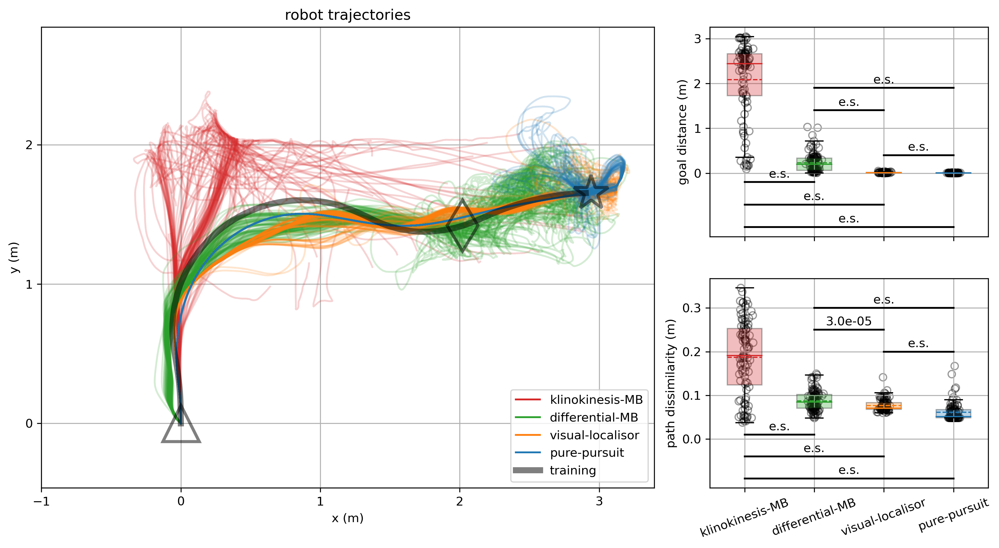

In [10]:
lw = 5

fig, axes = plt.subplot_mosaic('''
                                AAE
                                AAD
                                ''', figsize=(14, 7), dpi=300)


ls_model_name = 'klinokinesis-MB', 'differential-MB', 'visual-localisor', 'pure-pursuit'
ls_color = 'tab:red', 'tab:green', 'tab:orange', 'tab:blue'

ls_validx = 0, 0, 0, 0

# trajectory
ax = axes['A']

for model_name, color, validx in zip(ls_model_name, ls_color, ls_validx):
    dtp_train, dtp_test_trunc = [data_path[model_name][phase][validx] for phase in ('train', 'test_trunc')]
        
    for trial_idx, path_test_trunc in enumerate(dtp_test_trunc):
        ax.plot(-path_test_trunc[1], path_test_trunc[0], c=color, alpha=0.2)
            
    ax.plot([], [], c=color, label=model_name)
    
alpha = 0.5    
path_train = data_path['pure-pursuit']['train'][0]
ax.plot(-path_train[0][1, :goal_idx], path_train[0][0, :goal_idx], c='k', label='training', lw=lw, alpha=alpha)
ax.plot(-path_train[0][1, 0], path_train[0][0, 0], marker='^', c='k', mfc='none', markersize=30, markeredgewidth=lw/2, alpha=alpha)
ax.plot(-path_train[0][1, goal_idx], path_train[0][0, goal_idx], marker='*', c='k', mfc='none', markersize=30, markeredgewidth=lw/2, alpha=alpha)
ax.plot(-path_train[0][1, -28], path_train[0][0, -28], marker='d', c='k', mfc='none', markersize=30, markeredgewidth=lw/2, alpha=alpha)

ax.set_xlabel('x (m)')
ax.set_ylabel('y (m)')
ax.set_xticks(np.arange(-1, 3.1, 1))
ax.set_yticks(np.arange(0, 2.1, 1))
ax.set_aspect('equal', adjustable='datalim')    
ax.legend(loc=4)
ax.grid()
ax.set_title('robot trajectories')




# comparison
comparison_index = np.array([[0, 1], [0, 2], [0, 3], [1, 2], [1, 3], [2, 3]])
data_pval = []
for ak, alldata in zip('DE', (data_dsim_test2train, data_min_dist2goal)):
    ax = axes[ak]
    data = [alldata[model_name][validx] for model_name, validx in zip(ls_model_name, ls_validx)]
    myboxplot(ax, data, ls_model_name, ls_color, 0.4)
    pvalues = myttests(data, comparison_index, ispaired=False, permutations=100000)
    data_pval.append(pvalues)
    print(group_pairwise_test(data))

        
for ak, yl, yt in zip('DE', ('path dissimilarity (m)', 'goal distance (m)'), 
                        (np.arange(0, 0.4, 0.1), np.arange(0, 4, 1))):
    ax = axes[ak]
    ax.set_ylabel(yl)
    ax.set_yticks(yt)
    ax.grid()
    
for ak, pvalues, h, ys in zip('DE', data_pval, (.01, .1), ((.01, -.04, -.09, 0.25, 0.3, 0.2), (-.2, -.7, -1.2, 1.4, 1.9, 0.4))):
    ax = axes[ak]
    for pval, y, (xa, xb) in zip(pvalues, ys, comparison_index + 1):
        ax.plot([xa, xb], [y, y], color='k')
        if pval == 0:
            plabel = 'e.s.'
        elif pval <= 0.05:
            plabel = '{:.1e}'.format(pval)
        else:
            plabel = 'n.s.'
        ax.text((xa + xb) / 2, y + h, plabel, horizontalalignment='center')
        
        
axes['E'].set_xticklabels([])#['', '', '', ''])
axes['D'].set_xticklabels(ls_model_name, rotation=20)

Text(0.5, 1.0, 'robot trajectories')

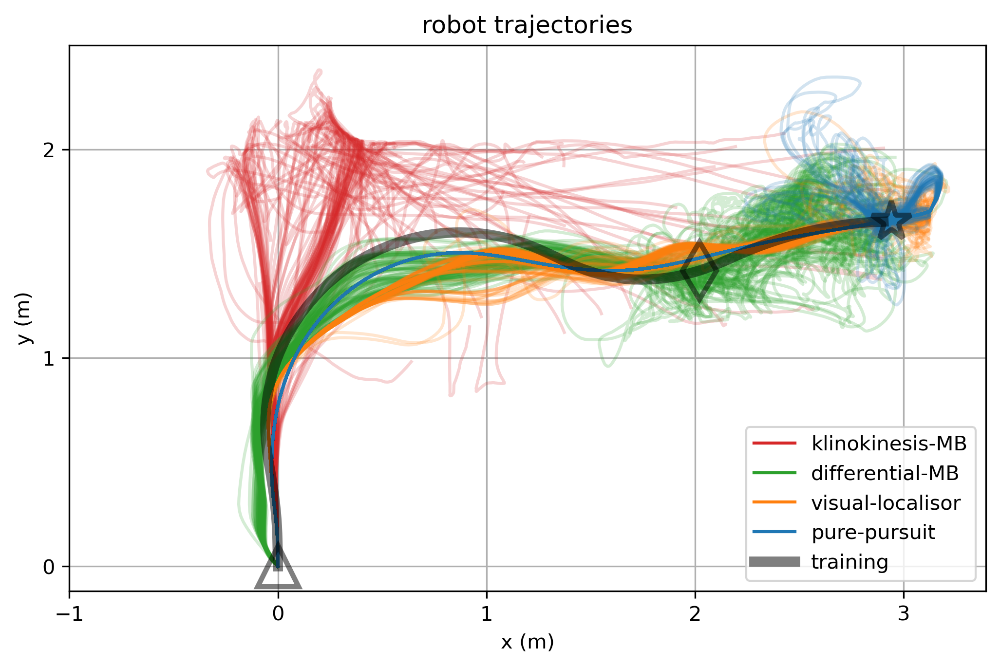

In [11]:
lw = 5

fig, axes = plt.subplot_mosaic('''
                                A
                                ''', figsize=(7, 7), dpi=300)
fig.tight_layout()


ls_model_name = 'klinokinesis-MB', 'differential-MB', 'visual-localisor', 'pure-pursuit'
ls_color = 'tab:red', 'tab:green', 'tab:orange', 'tab:blue'

ls_validx = 0, 0, 0, 0

# trajectory
ax = axes['A']

for model_name, color, validx in zip(ls_model_name, ls_color, ls_validx):
    dtp_train, dtp_test_trunc = [data_path[model_name][phase][validx] for phase in ('train', 'test_trunc')]
        
    for trial_idx, path_test_trunc in enumerate(dtp_test_trunc):
        ax.plot(-path_test_trunc[1], path_test_trunc[0], c=color, alpha=0.2)
            
    ax.plot([], [], c=color, label=model_name)
    
alpha = 0.5    
mkrs = 20
path_train = data_path['pure-pursuit']['train'][0]
ax.plot(-path_train[0][1, :goal_idx], path_train[0][0, :goal_idx], c='k', label='training', lw=lw, alpha=alpha)
ax.plot(-path_train[0][1, 0], path_train[0][0, 0], marker='^', c='k', mfc='none', markersize=mkrs, markeredgewidth=lw/2, alpha=alpha)
ax.plot(-path_train[0][1, goal_idx], path_train[0][0, goal_idx], marker='*', c='k', mfc='none', markersize=mkrs, markeredgewidth=lw/2, alpha=alpha)
ax.plot(-path_train[0][1, -28], path_train[0][0, -28], marker='d', c='k', mfc='none', markersize=mkrs, markeredgewidth=lw/2, alpha=alpha)

ax.set_xlabel('x (m)')
ax.set_ylabel('y (m)')
ax.set_xticks(np.arange(-1, 3.1, 1))
ax.set_yticks(np.arange(0, 2.1, 1))
ax.set_aspect('equal')    
ax.legend(loc=4)
ax.grid()
ax.set_title('robot trajectories')

        
    

def myboxplot(ax, data, labels, colors, alpha_points, vertical=True):
    # plot individual data
    xticks = np.arange(len(data)) + 1
    for xtick, group_data in zip(xticks, data):
        if vertical:
            x, y = np.random.normal(xtick, 0.04, len(group_data)), group_data
        else:
            y, x = np.random.normal(xtick, 0.04, len(group_data)), group_data
        ax.scatter(x, y, facecolor='none', edgecolor='k', alpha=alpha_points)
    # boxplot
    bp = ax.boxplot(data, labels=labels, vert=vertical,
                    showfliers=False, showmeans=True, meanline=True, patch_artist=True, widths=0.5)
    for patch, color in zip(bp['boxes'], colors):
        patch.set_facecolor(color)
        patch.set_alpha(0.3)
    for linekey in ('means', 'medians'):
        for line, color in zip(bp[linekey], colors):
            line.set_color(color)
    return ax

def pheatmap(ax, data, vmin=-50, vmax=np.log10(0.05)):
    matp = group_pairwise_test(data)
    matlogp = np.where(matp > 0, np.log10(matp), vmin)
    mattext = np.where(matp > 0, -np.round(matlogp, 0).astype(int), 'inf')
    matkorw = np.where(matlogp > vmin / 2, 'k', 'w')
    ax.imshow(matlogp, cmap='gray', vmin=vmin, vmax=vmax)
    for i in range(matp.shape[0]):
        for j in range(matp.shape[1]):
            if i != j: ax.text(j, i, mattext[i, j], 
                               ha="center", va="center", color=matkorw[i, j], fontsize=10)
    return ax

def plot2metric(data_goaldist, data_pathdsim, 
                ls_model_name, ls_color, dot_alpha,
                figsize, dpi=300):
    fig, axes = plt.subplot_mosaic('''
                                    AAAC
                                    BBBD
                                    ''', figsize=figsize, dpi=dpi)
    fig.subplots_adjust(hspace=0.05, wspace=0)
    
    for ak1, ak2, data, xlabel in zip('AB', 
                                      'CD',
                                      (data_goaldist, data_pathdsim), 
                                      ('goal distance $\delta_g$ (m)', 'path dissimilarity $\delta_\Gamma$ (m)')
                                     ):
        ax1, ax2 = axes[ak1], axes[ak2]
        # boxplot
        myboxplot(ax1, data, ls_model_name, ls_color, dot_alpha, vertical=False)
        ax1.set_xlabel(xlabel)
        ax1.grid()
        # heatmap
        pheatmap(ax2, data)
        ax2.set_xticks([])
        ax2.set_yticks([])
        
    axes['A'].xaxis.set_label_position('top')
    axes['A'].xaxis.set_ticks_position('top')
    axes['C'].set_title('$-$log$_{10}$($p$)')

/home/yihelu/miniconda3/envs/igibson/lib/python3.8/site-packages/igibson/yihe/analysis_by_plot.py:36: RuntimeWarning: divide by zero encountered in log10
  matlogp = np.where(matp > 0, np.log10(matp), vmin)
/home/yihelu/miniconda3/envs/igibson/lib/python3.8/site-packages/igibson/yihe/analysis_by_plot.py:36: RuntimeWarning: divide by zero encountered in log10
  matlogp = np.where(matp > 0, np.log10(matp), vmin)


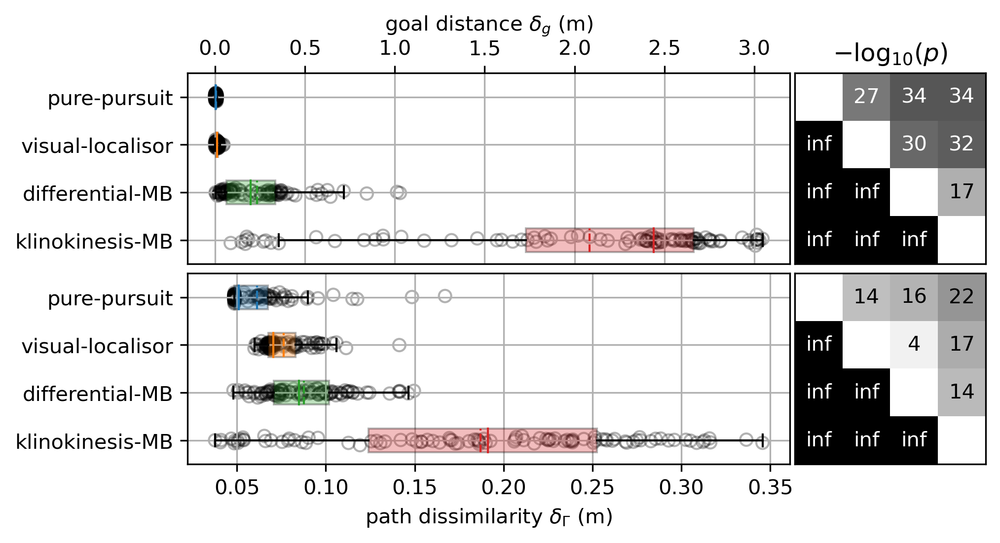

In [12]:
data_goaldist = [data_min_dist2goal[model_name][validx] for model_name, validx in zip(ls_model_name, ls_validx)]
data_pathdsim = [data_dsim_test2train[model_name][validx] for model_name, validx in zip(ls_model_name, ls_validx)]
plot2metric(data_goaldist, data_pathdsim, ls_model_name, ls_color, 
            dot_alpha=0.3, figsize=(7, 3.5))

[[1.00000000e+00 3.02970000e-01 0.00000000e+00]
 [1.27239097e-06 1.00000000e+00 0.00000000e+00]
 [2.56214367e-34 4.26972593e-20 1.00000000e+00]]
[[1.00000000e+00 0.00000000e+00 1.64410000e-01]
 [1.36980743e-18 1.00000000e+00 0.00000000e+00]
 [3.57125779e-03 3.35865541e-16 1.00000000e+00]]


Text(0.5, 1.0, 'sensing noise level $\\sigma=10$')

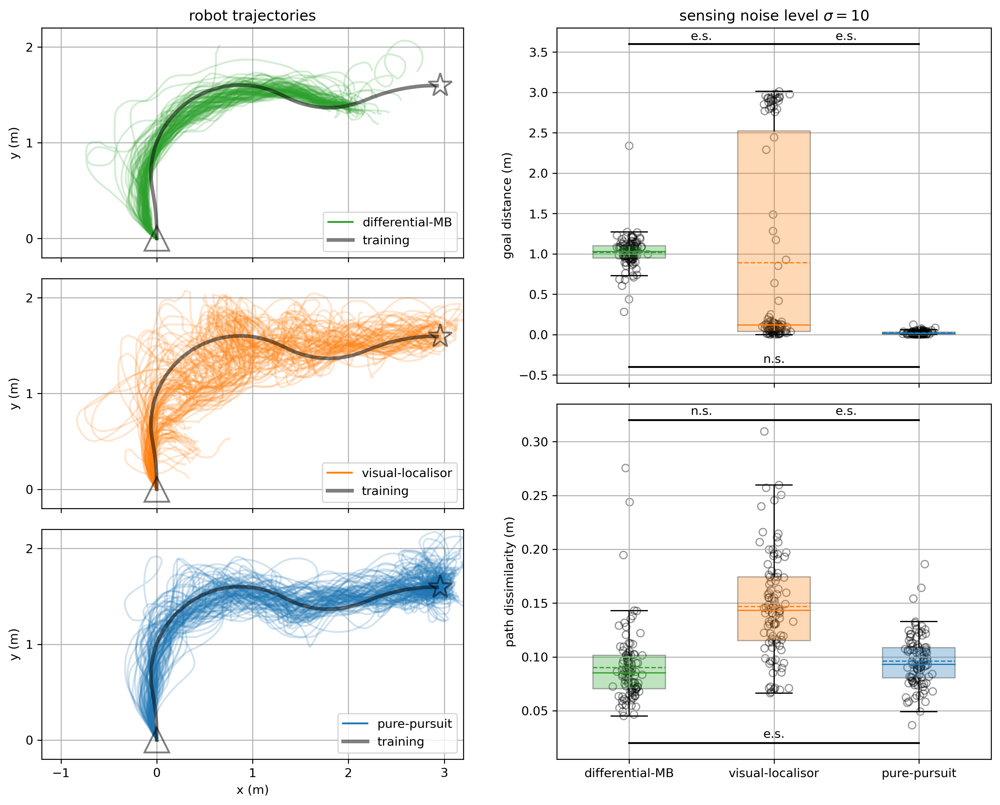

In [70]:
lw = 3

fig, axes = plt.subplot_mosaic('''
                                AD
                                AD
                                BD
                                BE
                                CE
                                CE
                                ''', figsize=(14, 11), dpi=300)


ls_model_name = 'differential-MB', 'visual-localisor', 'pure-pursuit'
ls_color = 'tab:green', 'tab:orange', 'tab:blue'

ls_validx = np.full(3, 7)

# trajectory
# ax = axes['A']

for ak, model_name, color, validx in zip('ABC', ls_model_name, ls_color, ls_validx):
    ax = axes[ak]
    dtp_train, dtp_test_trunc = [data_path[model_name][phase][validx] for phase in ('train', 'test_trunc')]
        
    for trial_idx, path_test_trunc in enumerate(dtp_test_trunc):
        ax.plot(-path_test_trunc[1], path_test_trunc[0], c=color, alpha=0.2)
            
    ax.plot([], [], c=color, label=model_name)
    
    alpha = 0.5    
    path_train = data_path['pure-pursuit']['train'][0]
    ax.plot(-path_train[0][1, :goal_idx], path_train[0][0, :goal_idx], c='k', label='training', lw=lw, alpha=alpha)
    ax.plot(-path_train[0][1, 0], path_train[0][0, 0], marker='^', c='k', mfc='none', markersize=20, markeredgewidth=lw/2, alpha=alpha)
    ax.plot(-path_train[0][1, goal_idx], path_train[0][0, goal_idx], marker='*', c='k', mfc='none', markersize=20, markeredgewidth=lw/2, alpha=alpha)
#     ax.plot(-path_train[0][1, -28], path_train[0][0, -28], marker='d', c='k', mfc='none', markersize=20, markeredgewidth=lw/2, alpha=alpha)

    ax.set_ylabel('y (m)')
    ax.set_xticks(np.arange(-1, 3.1, 1))
    ax.set_yticks(np.arange(0, 2.1, 1))
    ax.set_aspect('equal')    
    ax.legend(loc=4)
    ax.grid()
    ax.set_ylim(-0.2, 2.2)
    ax.set_xlim(-1.2, 3.2)


axes['A'].set_title('robot trajectories')
axes['C'].set_xlabel('x (m)')


# comparison
comparison_index = np.array([[0, 1], [0, 2], [1, 2]])
data_pval = []
for ak, alldata in zip('DE', (data_min_dist2goal, data_dsim_test2train)):
    ax = axes[ak]
    data = [alldata[model_name][validx] for model_name, validx in zip(ls_model_name, ls_validx)]
    myboxplot(ax, data, ls_model_name, ls_color, 0.4)
    pvalues = myttests(data, comparison_index, ispaired=False, permutations=int(1e5))
    data_pval.append(pvalues)
    print(group_pairwise_test(data))

        
for ak, yl, ylim in zip('DE', ('goal distance (m)', 'path dissimilarity (m)'), 
                        ((0.02, 1.2), (3e-6, 400))):
    ax = axes[ak]
#     ax.set_yscale('log')
    ax.set_ylabel(yl)
#     ax.set_ylim(*ylim)
    ax.grid()
    
for ak, pvalues, h, ys in zip('ED', data_pval, (.005, .05), ((.32, .02, .32), (3.6, -.4, 3.6))):
    ax = axes[ak]
    for pval, y, (xa, xb) in zip(pvalues, ys, comparison_index + 1):
        ax.plot([xa, xb], [y, y], color='k')
        if pval == 0:
            plabel = 'e.s.'
        elif pval <= 0.05:
            plabel = '{:.1e}'.format(pval)
        else:
            plabel = 'n.s.'
        ax.text((xa + xb) / 2, y + h, plabel, horizontalalignment='center')
        
        
for ak in 'ABD':
    axes[ak].set_xticklabels([])

# axes['D'].set_title(r'steering noise level $\sigma=10$')
axes['D'].set_title(r'sensing noise level $\sigma=10$')

/home/yihelu/miniconda3/envs/igibson/lib/python3.8/site-packages/igibson/yihe/analysis_by_plot.py:36: RuntimeWarning: divide by zero encountered in log10
  matlogp = np.where(matp > 0, np.log10(matp), vmin)
/home/yihelu/miniconda3/envs/igibson/lib/python3.8/site-packages/igibson/yihe/analysis_by_plot.py:36: RuntimeWarning: divide by zero encountered in log10
  matlogp = np.where(matp > 0, np.log10(matp), vmin)


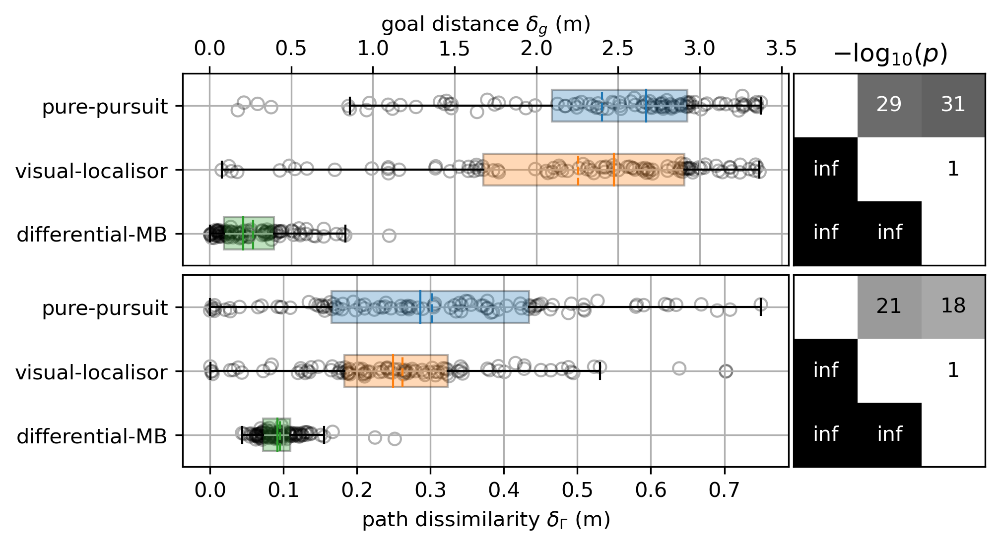

In [13]:
ls_model_name = 'differential-MB', 'visual-localisor', 'pure-pursuit'
ls_color = 'tab:green', 'tab:orange', 'tab:blue'
ls_validx = np.full(3, 7)

data_goaldist = [data_min_dist2goal[model_name][validx] for model_name, validx in zip(ls_model_name, ls_validx)]
data_pathdsim = [data_dsim_test2train[model_name][validx] for model_name, validx in zip(ls_model_name, ls_validx)]
plot2metric(data_goaldist, data_pathdsim, ls_model_name, ls_color, 
            dot_alpha=0.3, figsize=(7, 3.5))

Text(0.0, 1.0, 'sensing noise level $\\sigma=10$')

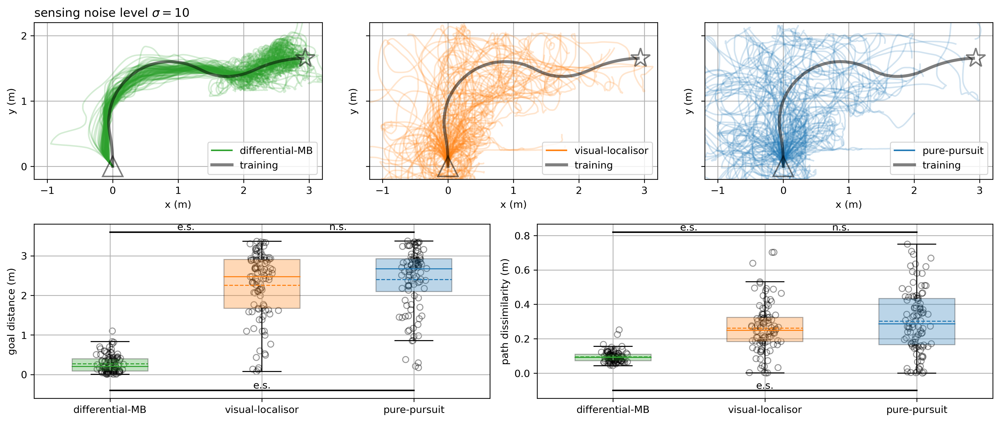

In [41]:
lw = 3

fig, axes = plt.subplot_mosaic('''
                                AABBCC
                                DDDEEE
                                ''', figsize=(14, 6), dpi=300, layout='tight')


ls_model_name = 'differential-MB', 'visual-localisor', 'pure-pursuit'
ls_color = 'tab:green', 'tab:orange', 'tab:blue'

ls_validx = np.full(3, 7)

# trajectory
# ax = axes['A']

for ak, model_name, color, validx in zip('ABC', ls_model_name, ls_color, ls_validx):
    ax = axes[ak]
    dtp_train, dtp_test_trunc = [data_path[model_name][phase][validx] for phase in ('train', 'test_trunc')]
        
    for trial_idx, path_test_trunc in enumerate(dtp_test_trunc):
        ax.plot(-path_test_trunc[1], path_test_trunc[0], c=color, alpha=0.2)
            
    ax.plot([], [], c=color, label=model_name)
    
    alpha = 0.5    
    path_train = data_path['pure-pursuit']['train'][0]
    ax.plot(-path_train[0][1, :goal_idx], path_train[0][0, :goal_idx], c='k', label='training', lw=lw, alpha=alpha)
    ax.plot(-path_train[0][1, 0], path_train[0][0, 0], marker='^', c='k', mfc='none', markersize=20, markeredgewidth=lw/2, alpha=alpha)
    ax.plot(-path_train[0][1, goal_idx], path_train[0][0, goal_idx], marker='*', c='k', mfc='none', markersize=20, markeredgewidth=lw/2, alpha=alpha)
#     ax.plot(-path_train[0][1, -28], path_train[0][0, -28], marker='d', c='k', mfc='none', markersize=20, markeredgewidth=lw/2, alpha=alpha)

    ax.set_xticks(np.arange(-1, 3.1, 1))
    ax.set_yticks(np.arange(0, 2.1, 1))
    ax.set_aspect('equal')    
    ax.legend(loc=4)
    ax.grid()
    ax.set_ylim(-0.2, 2.2)
    ax.set_xlim(-1.2, 3.2)    
    ax.set_xlabel('x (m)')
    
    ax.set_ylabel('y (m)')


# comparison
comparison_index = np.array([[0, 1], [0, 2], [1, 2]])
data_pval = []
for ak, alldata in zip('DE', (data_min_dist2goal, data_dsim_test2train)):
    ax = axes[ak]
    data = [alldata[model_name][validx] for model_name, validx in zip(ls_model_name, ls_validx)]
    myboxplot(ax, data, ls_model_name, ls_color, 0.4)
    pvalues = myttests(data, comparison_index, ispaired=False, permutations=int(1e5))
    data_pval.append(pvalues)

        
for ak, yl, ylim in zip('DE', ('goal distance (m)', 'path dissimilarity (m)'), 
                        ((0.02, 1.2), (3e-6, 400))):
    ax = axes[ak]
#     ax.set_yscale('log')
    ax.set_ylabel(yl)
#     ax.set_ylim(*ylim)
    ax.grid()
    
# for ak, pvalues, h, ys in zip('ED', data_pval, (.005, .05), ((.32, .02, .32), (3.6, -.4, 3.6))):
for ak, pvalues, h, ys in zip('ED', data_pval, (.01, .05), ((.82, -.1, .82), (3.6, -.4, 3.6))):
    ax = axes[ak]
    for pval, y, (xa, xb) in zip(pvalues, ys, comparison_index + 1):
        ax.plot([xa, xb], [y, y], color='k')
        if pval == 0:
            plabel = 'e.s.'
        elif pval <= 0.05:
            plabel = '{:.1e}'.format(pval)
        else:
            plabel = 'n.s.'
        ax.text((xa + xb) / 2, y + h, plabel, horizontalalignment='center')
        
        
for ak in 'BC':
    axes[ak].set_yticklabels([])

# axes['D'].set_title(r'steering noise level $\sigma=10$')
axes['A'].set_title(r'sensing noise level $\sigma=10$', loc='left')

fig, axes = plt.subplots(2, 5, figsize=(18, 8), sharex=True, sharey=True)

n_catch = []

for model_name, color in zip(ls_model_name, ls_color):
    for ax, dsim_val, mind_val, in zip(axes.flatten(), data_dsim_test2train[model_name], data_min_dist2goal[model_name]):
        ax.scatter(mind_val, dsim_val, color=color, alpha=0.3)
        n_catch.append(np.count_nonzero(mind_val <= catchment_radius))
        
# for ax in axes.flatten():
#     ax.set_xscale('log')
#     ax.axvline(catchment_radius)
#     ax.set_yscale('log')

n_catch = np.reshape(n_catch, (n_model, n_condition))

fig, axes = plt.subplots(2, 3, figsize=(14, 6), sharex=True, dpi=300)

for model_name, color in zip(ls_model_name, ls_color):
    for ax, data in zip(axes[1], (data_min_dist2goal[model_name], data_time_catchment[model_name], data_dsim_test2train[model_name])):
        quant = np.nanquantile(data, (0.25, 0.5, 0.75), axis=1)
        avg = np.nanmean(data, axis=1)
        ax.plot(np.arange(n_condition), avg, color=color, ls='dashed')
        ax.plot(np.arange(n_condition), quant[1], color=color, label=model_name)
        ax.fill_between(np.arange(n_condition), quant[0], quant[2], color=color, alpha=0.3)


for xoffset, model_name, color, nc in zip(np.arange(n_model) - n_model / 2 + 0.5, ls_model_name, ls_color, n_catch):
    area_success, n_reach_75 = [], []
    for dist_test2goal, dist_test2path in zip(data_dist_test2goal[model_name], data_dist_test2path[model_name]):
        progress = np.rint((1 - np.divide(dist_test2goal.T, dist_test2goal[:, 0]).T) * 100)
        progress_step = np.arange(np.nanmin(progress), np.nanmax(progress) + 1)

        val_n_point = []
        for trial_progress in progress:
            px = np.unique(trial_progress)
            val_n_point.extend(px)

        p_reach, n_reach = np.unique(val_n_point, return_counts=True)
        
        p_reach_75idx = np.nonzero(p_reach >= 75)[0]
        if len(p_reach_75idx) > 0:
            n_reach_75.append(n_reach[p_reach_75idx[0]])
        else:
            n_reach_75.append(0)
        
        p_reach_posidx = np.nonzero(p_reach > 0)
        n_reach_pos = np.interp(np.arange(101), p_reach[p_reach_posidx], n_reach[p_reach_posidx], left=100, right=0)
        
#         area_success.append(np.dot(np.arange(101) / 100, n_reach_pos / 100))
        area_success.append(np.dot((np.arange(101) / 100) ** 2, n_reach_pos / 100))
        
    wd = 0.6 / n_model
    xbar = np.arange(n_condition) + xoffset * wd * 1.5
    xbar = np.arange(n_condition) + xoffset * (wd + 0.04)
    for ax, yy in zip(axes[0], (n_reach_75, nc, area_success)):
        ax.bar(xbar, yy, label=model_name, width=wd, color=color)
        ax.plot(xbar, yy, ls='dashed', color=color)
    
for ax, yl in zip(axes.flatten(), 
                  ('reaching 75% rate (%)', 
                   'reaching catchment rate (%)', 
                   'overall progression score (a.u)',
                   'minimal distance to goal (m)', 
                   'time reaching catchment (epoch)',
                   'overall trajectory dissimilarity (m)')):
    ax.set_ylabel(yl)
    
# for ax in axes[:-1]:
#     ax.set_ylim(top=102)

for ax in axes.flatten():
    ax.grid()
    ax.set_xticks(np.arange(n_condition), ls_value)
#     ax.set_xlabel('noise level (a.u.)')
    ax.set_xlabel('rotation coefficient (a.u.)')
    
# for ax in axes.T[0]:
axes[0, 0].legend(loc=3)
# axes[1, 2].set_yticks([0.05, 0.1, 0.15])

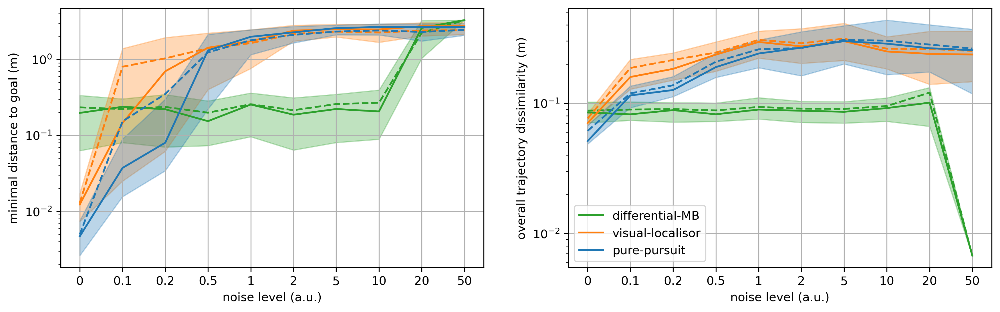

In [12]:
fig, axes = plt.subplots(1, 2, figsize=(14, 4), sharex=True, dpi=300)

for model_name, color in zip(ls_model_name, ls_color):
    for ax, data in zip(axes, (data_min_dist2goal[model_name], data_dsim_test2train[model_name])):
        quant = np.nanquantile(data, (0.25, 0.5, 0.75), axis=1)
        avg = np.nanmean(data, axis=1)
        ax.plot(np.arange(n_condition), avg, color=color, ls='dashed')
        ax.plot(np.arange(n_condition), quant[1], color=color, label=model_name)
        ax.fill_between(np.arange(n_condition), quant[0], quant[2], color=color, alpha=0.3)

    
for ax, yl in zip(axes.flatten(), 
                  ('minimal distance to goal (m)', 'overall trajectory dissimilarity (m)')):
    ax.set_ylabel(yl)
    ax.grid()
    ax.set_xticks(np.arange(n_condition), ls_value)
    ax.set_xlabel('noise level (a.u.)')
    ax.set_yscale('log')

axes[1].legend()

data_min_dist2goal_5in1, data_dsim_test2train_5in1 = data_min_dist2goal, data_dsim_test2train
model_5name = model_name
ls_5color = color

In [13]:
data_min_dist2goal_sense, data_dsim_test2train_sense = data_min_dist2goal, data_dsim_test2train

In [14]:
data_min_dist2goal_steer, data_dsim_test2train_steer = data_min_dist2goal, data_dsim_test2train

In [15]:
data_min_dist2goal_trunc, data_dsim_test2train_trunc = data_min_dist2goal, data_dsim_test2train

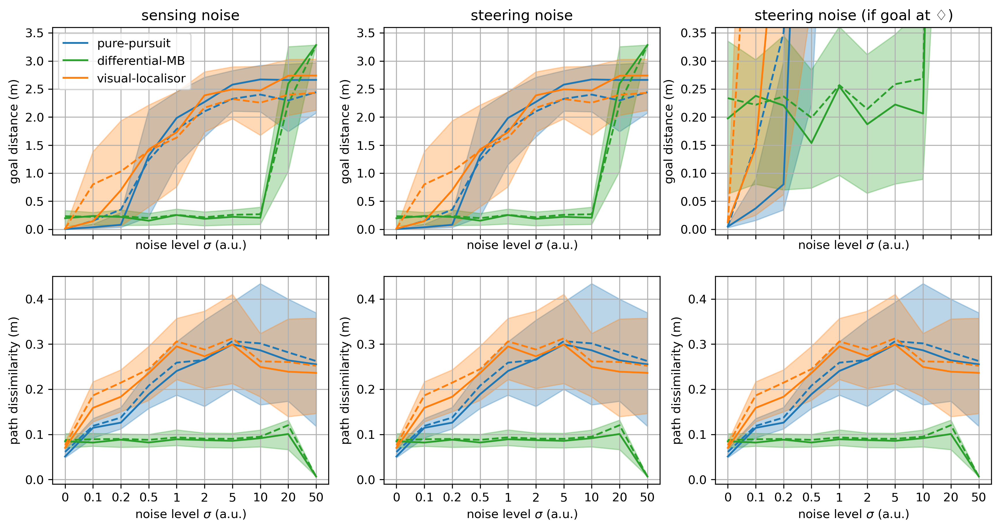

In [16]:
fig, axes = plt.subplots(2, 3, figsize=(14, 7), sharex=True, dpi=300)

ls_model_name = 'pure-pursuit', 'differential-MB', 'visual-localisor'#, 'visual-localisor-v', 'visual-localisor-l'
ls_color = 'tab:blue', 'tab:green', 'tab:orange'#, 'tab:purple', 'tab:brown'

for axcol, dat_md, dat_dd in zip(axes.T, 
                                 (data_min_dist2goal_sense, data_min_dist2goal_steer, data_min_dist2goal_trunc),
                                 (data_dsim_test2train_sense, data_dsim_test2train_steer, data_dsim_test2train_trunc)):
    for model_name, color in zip(ls_model_name, ls_color):
        if model_name not in dat_md.keys(): continue
        for ax, data in zip(axcol, (dat_md[model_name], dat_dd[model_name])):
            quant = np.nanquantile(data, (0.25, 0.5, 0.75), axis=1)
            avg = np.nanmean(data, axis=1)
            ax.plot(np.arange(n_condition), avg, color=color, ls='dashed')
            ax.plot(np.arange(n_condition), quant[1], color=color, label=model_name)
            ax.fill_between(np.arange(n_condition), quant[0], quant[2], color=color, alpha=0.3)

    
for axrow, yl in zip(axes, 
                  ('goal distance (m)', 'path dissimilarity (m)')):
    [ax.set_ylabel(yl) for ax in axrow]

for ax, tt in zip(axes[0], ('sensing noise', 'steering noise', r'steering noise (if goal at $\diamondsuit$)')):
    ax.set_title(tt)
#     ax.set_ylim(top=2.6)
    
    
for ax in axes.flatten():
    ax.grid()
    ax.set_xticks(np.arange(n_condition), ls_value)
    ax.set_xlabel(r'noise level $\sigma$ (a.u.)')  
    
axes[0, 0].legend()


for ax in axes[0, :2]:
    ax.set_ylim(-0.1, 3.6)
axes[0, 2].set_ylim(-0.01, 0.36)

for ax in axes[1]:
    ax.set_ylim(-0.01, 0.45)
